In [1]:
%load_ext autoreload
%autoreload 2

In [2]:
import hsfm
import hipp

# Single Date - Single Block

In this example we will process eight overlapping NAGAP images taken on 1977-09-27 over Easton Glacier at Mt Baker, WA.

## Select NAGAP imagery
The nagap_image_metadata.csv file has been compiled from NAGAP metadata files available at www.arcticdata.io. The file contains all images for which a tif image url is available in the original metadata. Some images do not have location information, but are still included in the csv and returned if no spatial filter condition is set.

#### Notes
- All spatial and temporal filter conditions are optional
- Specify bounds as (ULLON, ULLAT, LRLON, LRLAT)
- Specify year as 77, e.g. for year 1977




In [3]:
nagap_metadata_csv = 'https://github.com/friedrichknuth/hipp/raw/master/examples/fiducial_proxy_detection/input_data/nagap_image_metadata.csv'

In [4]:
bounds= (-121.846, 48.76, -121.823, 48.70) # approximate bounds for Easton glacier
year = 77
month = 9
day = 27

In [5]:
df = hipp.dataquery.NAGAP_pre_select_images(nagap_metadata_csv,
                                            bounds = bounds,
                                            year = year,
                                            month = month,
                                            day = day,
                                           )

Selecting images based on:
bounds: (-121.846, 48.76, -121.823, 48.7)
year: 77
month: 9
day: 27


## Prepare metadata csv for processing with Metashape
If you are processing images from other archives - prepare a metadata csv with the same columns

In [6]:
hsfm.core.prepare_metashape_metadata(df,
                                     output_directory='input_data',
                                     focal_length = 151.303,
                                     pixel_pitch = 0.02)

input_data/metashape_metadata.csv


,image_file_name,lon,lat,alt,lon_acc,lat_acc,alt_acc,yaw,pitch,roll,yaw_acc,pitch_acc,roll_acc,focal_length,pixel_pitch
0,NAGAP_77V6_062.tif,-121.837550,48.724079,3000,1000,1000,1000,0.0,0.0,0.0,180,20,20,151.303,0.02
1,NAGAP_77V6_063.tif,-121.838120,48.731064,3000,1000,1000,1000,0.0,0.0,0.0,180,20,20,151.303,0.02
2,NAGAP_77V6_064.tif,-121.837946,48.733960,3000,1000,1000,1000,0.0,0.0,0.0,180,20,20,151.303,0.02
3,NAGAP_77V6_065.tif,-121.837646,48.737960,3000,1000,1000,1000,0.0,0.0,0.0,180,20,20,151.303,0.02
4,NAGAP_77V6_066.tif,-121.837007,48.741511,3000,1000,1000,1000,0.0,0.0,0.0,180,20,20,151.303,0.02
5,NAGAP_77V6_067.tif,-121.836373,48.745096,3000,1000,1000,1000,0.0,0.0,0.0,180,20,20,151.303,0.02
6,NAGAP_77V6_068.tif,-121.836588,48.748474,3000,1000,1000,1000,0.0,0.0,0.0,180,20,20,151.303,0.02
7,NAGAP_77V6_069.tif,-121.842298,48.754492,3000,1000,1000,1000,0.0,0.0,0.0,180,20,20,151.303,0.02


## Download USGS 3DEP reference DSM

In [24]:
import gdown
reference_dem = 'input_data/easton_reference_DSM.tif'
gdown.download(id='1YBDJIoC1gyfP2U58WMVrSoKm2-xFVxse', 
               output=reference_dem, 
               quiet=False)

## Download images to disk 



In [25]:
image_directory = hipp.dataquery.NAGAP_download_images_to_disk(df, 
                                                               output_directory='input_data/raw_images')

## Specify marker templates

See [this example](https://github.com/friedrichknuth/hipp/blob/master/examples/fiducial_proxy_detection/nagap_imagery.ipynb) on how to create new templates

In [9]:
template_directory = '../src/hipp/examples/fiducial_proxy_detection/input_data/fiducials/nagap/notch'

## Detect fiducial markers, crop, and enhance contrast
Stretching the histogram and enhancing the contrast is optional

In [26]:
hipp.batch.preprocess_with_fiducial_proxies(image_directory,
                                            template_directory,
                                            output_directory='input_data/cropped_images',
                                            stretch_histogram = True,
                                            clahe_enhancement = True)

## SfM processing with Metashape

In [11]:
hsfm.metashape.authentication('/mnt/working/knuth/sw/metashape-pro/uw_agisoft.lic')

In [12]:
project_name          = 'easton_1977'
output_path           = 'output_data/'
images_path           = 'input_data/cropped_images'
images_metadata_file  = 'input_data/metashape_metadata.csv'
focal_length          = 151.303
pixel_pitch           = 0.02
image_matching_accuracy = 1
densecloud_quality      = 2


In [27]:
project_file, point_cloud_file = hsfm.metashape.images2las(project_name,
                                            images_path,
                                            images_metadata_file,
                                            output_path,
                                            focal_length            = focal_length,
                                            pixel_pitch             = pixel_pitch,
                                            image_matching_accuracy = image_matching_accuracy,
                                            densecloud_quality      = densecloud_quality)

### Grid DEM and compare to reference

In [28]:
# %%capture
epsg_code = 'EPSG:'+ hsfm.geospatial.get_epsg_code(reference_dem)
dem = hsfm.asp.point2dem(point_cloud_file, 
                         '--nodata-value','-9999',
                         '--tr','0.5',
                         '--t_srs', epsg_code,
                         verbose=True)

In [29]:
dem_diff_inital =  hsfm.utils.difference_dems(reference_dem, 
                                              dem)

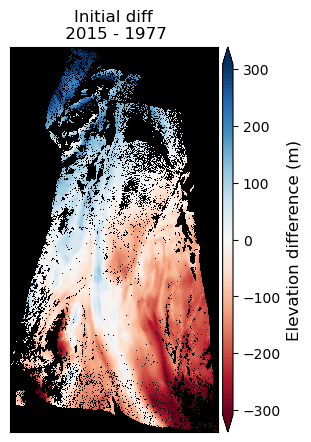

In [16]:
hsfm.plot.plot_dem_difference_from_file(dem_diff_inital,
                                        cmap='RdBu',
                                        vmin =None,
                                        vmax =None,
                                        title = 'Initial diff\n 2015 - 1977',
                                        ticks_off = True)

### Coregister DEM with ICP

In [30]:
# %%capture
aligned_dem_file, _ =  hsfm.asp.pc_align_p2p_sp2p(dem,
                                                  reference_dem,
                                                  output_path,
                                                  verbose = True)

In [18]:
dem_diff_after_ICP =  hsfm.utils.difference_dems(reference_dem, 
                                       aligned_dem_file)

geodiff input_data/easton_reference_DSM.tif output_data/pc_align/run-run-run-trans_source-DEM.tif -o input_data/easton_reference_DSM


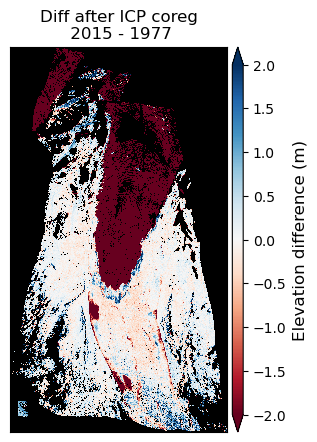

In [19]:
hsfm.plot.plot_dem_difference_from_file(dem_diff_after_ICP,
                                        cmap='RdBu',
                                        vmin = -2,
                                        vmax = 2,
                                        title = 'Diff after ICP coreg\n 2015 - 1977',
                                        ticks_off = True)

### Apply Nuth and Kaab coregistration to DEM after ICP
In this case the Nuth and Kaab coregistration doesn't change much

In [31]:
# %%capture
_, final_dem = hsfm.utils.dem_align_custom(reference_dem,
                                           aligned_dem_file,
                                           verbose = True)

In [32]:
dem_diff_after_ICP_and_NK =  hsfm.utils.difference_dems(reference_dem, 
                                                        final_dem)

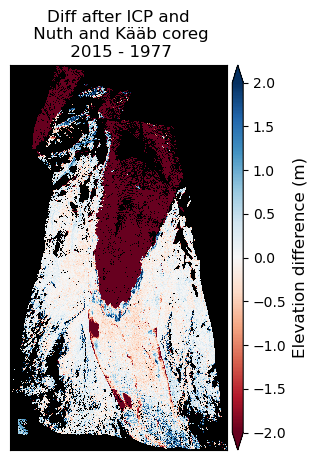

In [22]:
hsfm.plot.plot_dem_difference_from_file(dem_diff_after_ICP_and_NK,
                                        cmap='RdBu',
                                        vmin = -2,
                                        vmax = 2,
                                        title = 'Diff after ICP and\n Nuth and Kääb coreg\n 2015 - 1977',
                                        ticks_off = True)

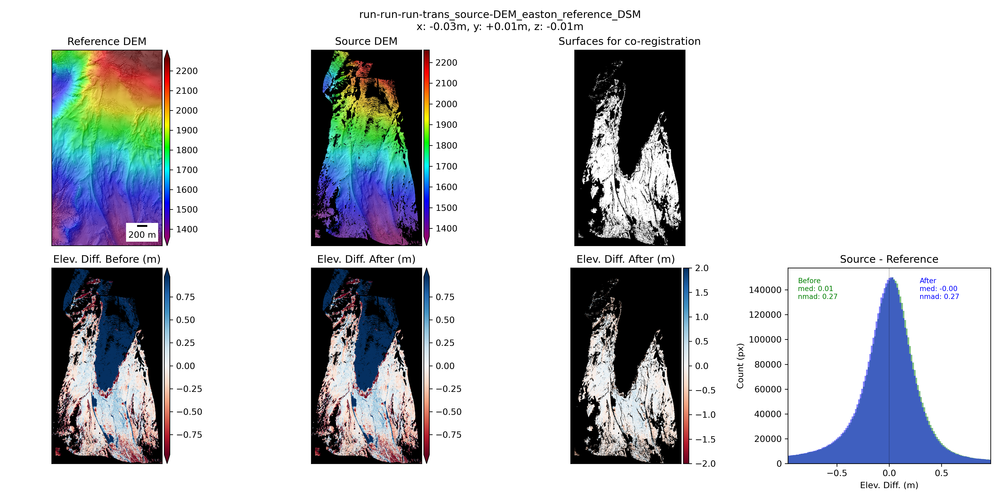

In [23]:
from pathlib import Path
from IPython.display import Image
Image(Path(final_dem).with_suffix('.png'))